# The calibration of the VIX implied volatility expansion

In this notebook, we provide the procedure of the calibrating the mixed rough Bergomi model to the market data collected in 2017-11-22.

## 1. Data preprocessing

In [1]:
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np

data_path = r"C:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\data\vix_implied_vol_20171122.csv"

df = pd.read_csv(data_path)

print("The data for the first row: ")
print(df.iloc[0].to_dict())

has_nan = df.isna().values.any()
print("\n Check if there exists the NaN: ", has_nan)

missing_per_col = df.isna().sum()
print("\n The missing value in each column: ")
print(missing_per_col)

The data for the first row: 
{'Expiry': 20171220.0, 'Texp': 0.0833333333333333, 'Strike': 9.1, 'Fwd': 11.48, 'Mid': 0.551}

 Check if there exists the NaN:  False

 The missing value in each column: 
Expiry    0
Texp      0
Strike    0
Fwd       0
Mid       0
dtype: int64


In [3]:
df['Strike'] = df['Strike'] / 100
df['Fwd'] = df['Fwd'] / 100

## 2. Data visualization

### 2.1 VIX futures

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context("talk")
sns.set_style("darkgrid")

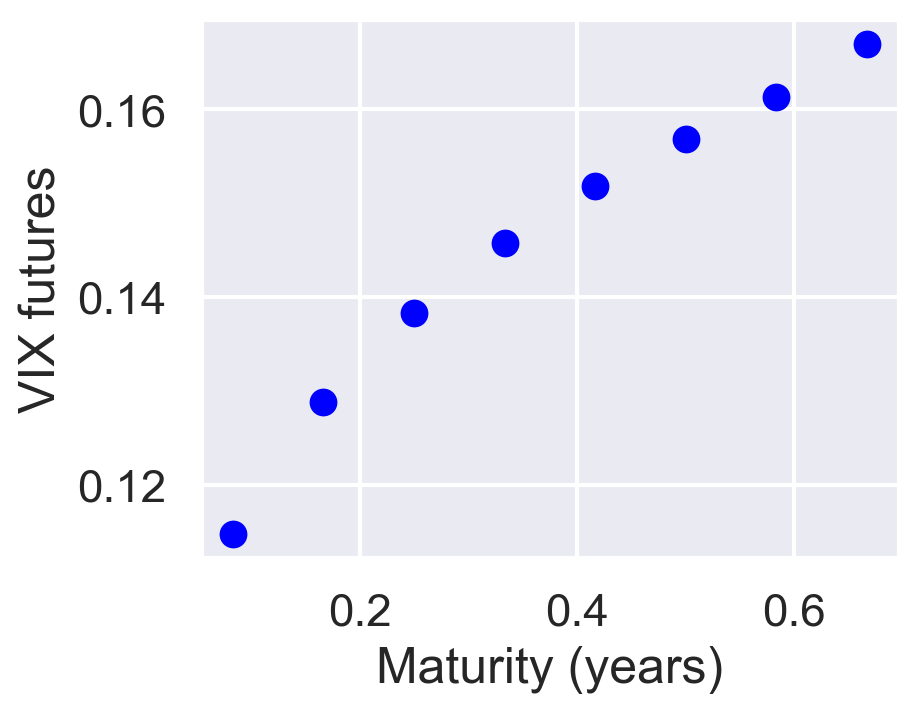

In [5]:
plot_data = df.groupby('Texp')['Fwd'].first().reset_index()
plot_data = plot_data.sort_values(by='Texp')

x_texp = plot_data['Texp']
y_fwd = plot_data['Fwd']

plt.figure(figsize=(4.5, 3.5))

plt.plot(x_texp, y_fwd, marker='o', linestyle='None', color="blue")

plt.xlabel('Maturity (years)')
plt.ylabel('VIX futures')

plt.show()

### 2.2 VIX smiles

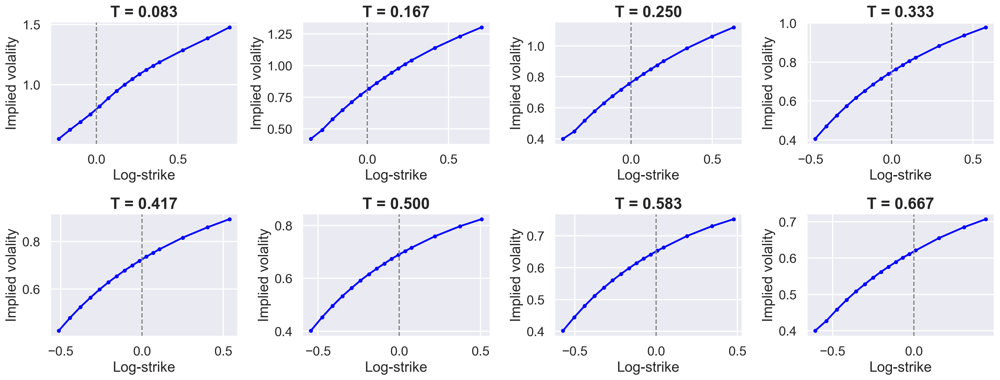

In [6]:
groups = list(df.groupby('Texp'))
n_groups = len(groups)

ncols = 4
nrows = int(np.ceil(n_groups / float(ncols)))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 4.5, nrows * 3.5))
axes_flat = axes.flatten()

for i, (T, g) in enumerate(groups):
    
    ax = axes_flat[i]

    fwd_mkt = g['Fwd'].unique()[0]
    strikes = g['Strike']
    mid_ivs = g['Mid']
    log_strikes = np.log(strikes / fwd_mkt)

    sort_indices = np.argsort(log_strikes)
    x_sorted = log_strikes.iloc[sort_indices]
    y_mid_sorted = mid_ivs.iloc[sort_indices]

    ax.plot(
        x_sorted, 
        y_mid_sorted, 
        marker='o',
        linestyle='-',
        color='blue',
        markersize=4,
        label="Mid IV"
    )
    
    ax.axvline(x=0, color='grey', linestyle='--', linewidth=1.5)

    ax.set_title(f"T = {T:.3f}", fontsize=20, fontweight='bold')
    ax.set_xlabel("Log-strike")
    ax.set_ylabel("Implied volality")

for j in range(n_groups, nrows * ncols):
    axes_flat[j].axis('off')

plt.tight_layout()
plt.show()

## 3. Calibration to one maturity

### 3.1 Use the fixed initial guess for all parameters

In [7]:
import calibration

eta1 = 2
eta2 = 0.2
xi0 = 0.02
lbd = 0.5
params_init_fixed = [eta1, eta2, xi0, lbd]

#### 3.1.1 The root-finding method - Monte-Carlo Method

In [8]:
results_rf_mc = {}

current_params_guess = np.array(params_init_fixed).copy()

for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    xi0_smart_guess = fwd_mkt**2
    current_params_guess[3] = xi0_smart_guess

    res = calibration.calib_one_maturity(
        T=T,
        kappa=kappa_list,
        fwd_mkt=fwd_mkt,
        iv_mkt=mid_ivs,
        params_init=current_params_guess,
        params_num=4
    )
    
    res['initial_guess'] = current_params_guess.copy()

    current_params_guess[0] = res["vol_of_vol1"]
    current_params_guess[1] = res["vol_of_vol2"]
    current_params_guess[2] = res["xi0"] 
    current_params_guess[3] = res["lbd"]
    
    results_rf_mc[T] = res

df_results_params_rf_mc = pd.DataFrame(results_rf_mc).T

if not df_results_params_rf_mc.empty:
    df_results_params_rf_mc = df_results_params_rf_mc.sort_index()
    df_results_params_rf_mc.index.name = 'T'
    df_results_params_rf_mc.index = df_results_params_rf_mc.index.astype(float)  

    if 'T' in df_results_params_rf_mc.columns:
        df_results_params_rf_mc = df_results_params_rf_mc.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_rf_mc)
        
    df_calib_results_rf_mc = calibration.repricing_calibrated_model(df, df_results_params_rf_mc)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==


c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: divide by zero encountered in divide
  (price - market) / market)
c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: invalid value encountered in divide
  (price - market) / market)


== Calibrating T = 0.167, the number of data points: 16 ==
== Calibrating T = 0.250, the number of data points: 16 ==
== Calibrating T = 0.333, the number of data points: 16 ==
== Calibrating T = 0.417, the number of data points: 16 ==
== Calibrating T = 0.500, the number of data points: 16 ==
== Calibrating T = 0.583, the number of data points: 16 ==
== Calibrating T = 0.667, the number of data points: 16 ==

Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333         2.0         0.2  0.1  0.013293  0.013179  4.150363   
0.166667    1.909397         0.2  0.1  0.021779   0.52423  0.071749   
0.250000    0.107958    0.486386  0.1  0.020616  0.019127  0.651009   
0.333333    0.107958    0.486386  0.1  0.023168  0.021258  0.504587   
0.416667    0.107958    0.658571  0.1   0.02743  0.023043  0.131404   
0.500000    0.107958     0.65857  0.1  0.

#### 3.1.2 The root-finding method - Weak approximation

In [9]:
N_GAUSS = 80

In [10]:
results_rf = {}

current_params_guess = np.array(params_init_fixed).copy()

for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    xi0_smart_guess = fwd_mkt**2
    current_params_guess[3] = xi0_smart_guess

    res = calibration.calib_one_maturity_proxy(
        T=T,
        kappa=kappa_list,
        fwd_mkt=fwd_mkt,
        iv_mkt=mid_ivs,
        params_init=current_params_guess,
        params_num=4,
        n_gauss=N_GAUSS
    )
    
    res['initial_guess'] = current_params_guess.copy()

    current_params_guess[0] = res["vol_of_vol1"]
    current_params_guess[1] = res["vol_of_vol2"]
    current_params_guess[2] = res["xi0"] 
    current_params_guess[3] = res["lbd"]
    
    results_rf[T] = res

df_results_params_rf = pd.DataFrame(results_rf).T

if not df_results_params_rf.empty:
    df_results_params_rf = df_results_params_rf.sort_index()
    df_results_params_rf.index.name = 'T'
    df_results_params_rf.index = df_results_params_rf.index.astype(float)  

    if 'T' in df_results_params_rf.columns:
        df_results_params_rf = df_results_params_rf.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_rf)
        
    df_calib_results_rf = calibration.repricing_calibrated_model(df, df_results_params_rf)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==
== Calibrating T = 0.167, the number of data points: 16 ==
== Calibrating T = 0.250, the number of data points: 16 ==
== Calibrating T = 0.333, the number of data points: 16 ==
== Calibrating T = 0.417, the number of data points: 16 ==
== Calibrating T = 0.500, the number of data points: 16 ==
== Calibrating T = 0.583, the number of data points: 16 ==
== Calibrating T = 0.667, the number of data points: 16 ==

Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333         2.0         0.2  0.1  0.013298  0.013179  2.745254   
0.166667         2.0         0.2  0.1  0.016831  0.016589  2.503572   
0.250000         2.0    0.756381  0.1  0.023343  0.019127  0.426879   
0.333333         2.0    0.756381  0.1  0.026759  0.021258  0.279267   
0.416667         2.0    0.756381  0.1  0.029768  0.02

#### 3.1.3 The implied volatility expansion - Formula 1

In our approximation, there are three types of formulas for the VIX implied volatility approximation, and we test them one by one.
\begin{align*}
\bar{\sigma}_I = \frac{1}{2} \widetilde{\sigma} + \frac{1}{\text{e}^{x_1} \sqrt{T}} \sum_{n=1}^N \left(c_0 \omega_n + c_1 \partial_{\mu_{P,1}} \omega_n + c_2 \partial_{\mu_{P,1}}^2 \omega_n + c_3 \partial_{\mu_{P,1}}^3 \omega_n \right) \text{He}_{n-1} (B),
\end{align*}
where
\begin{align*}
x_1 := k_1 - \frac{B \sigma_{P,2}}{2} - \frac{\sigma_{P,2}^2}{8},&& k_1 = \ln (\kappa), && \widetilde{\sigma} := \frac{\sigma_{P,2}}{\sqrt{T}}.
\end{align*}

In [11]:
N_MAX = 20
N_MC = 10**6

In [12]:
formula = 1
current_params_guess = np.array(params_init_fixed).copy()

results_expan1 = {}
for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    xi0_smart_guess = fwd_mkt**2
    current_params_guess[3] = xi0_smart_guess

    res = calibration.calib_one_maturity_expan(
        T=T,
        kappa=kappa_list,
        fwd_mkt=fwd_mkt,
        iv_mkt=mid_ivs,
        params_init=current_params_guess,
        params_num=4,
        n_max=N_MAX,
        n_mc=N_MC,
        formula=formula
    )

    res['initial_guess'] = current_params_guess.copy()

    current_params_guess[0] = res["vol_of_vol1"]
    current_params_guess[1] = res["vol_of_vol2"]
    current_params_guess[2] = res["xi0"] 
    current_params_guess[3] = res["lbd"]

    results_expan1[T] = res

df_results_params_expan1 = pd.DataFrame(results_expan1).T

if not df_results_params_expan1.empty:
    df_results_params_expan1 = df_results_params_expan1.sort_index()
    df_results_params_expan1.index.name = 'T'
    df_results_params_expan1.index = df_results_params_expan1.index.astype(float)  

    if 'T' in df_results_params_expan1.columns:
        df_results_params_expan1 = df_results_params_expan1.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_expan1)
        
    df_calib_results_expan1 = calibration.repricing_calibrated_model_expan(df, df_results_params_expan1, formula)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==
== Calibrating T = 0.167, the number of data points: 16 ==
== Calibrating T = 0.250, the number of data points: 16 ==
== Calibrating T = 0.333, the number of data points: 16 ==
== Calibrating T = 0.417, the number of data points: 16 ==
== Calibrating T = 0.500, the number of data points: 16 ==
== Calibrating T = 0.583, the number of data points: 16 ==
== Calibrating T = 0.667, the number of data points: 16 ==

Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333    2.295267    0.301594  0.1  0.014242  0.186863   0.00322   
0.166667    2.108632    0.257505  0.1  0.019805  0.332682  0.006261   
0.250000    1.899123    0.253857  0.1  0.024213   0.40717  0.003943   
0.333333    1.661722    0.248838  0.1  0.027979  0.482628   0.00226   
0.416667    1.546972    0.262863  0.1  0.031314  0.52

#### 3.1.4 The implied volatility expansion - Formula 2

\begin{align*}
\bar{\sigma}_I = \frac{1}{2} \widetilde{\sigma} + \frac{1}{\text{e}^{x_2} \sqrt{T}} \sum_{n=1}^N \left(c_0 \omega_n + c_1 \partial_{\mu_{P,1}} \omega_n + c_2 \partial_{\mu_{P,1}}^2 \omega_n + c_3 \partial_{\mu_{P,1}}^3 \omega_n \right) \text{He}_{n-1} (B),
\end{align*}
where
\begin{align*}
x_2 := \ln \left(P^F\right), && k_2 := \ln \left(P^F\right) + \frac{B \sigma_{P,2}}{2} + \frac{\sigma_{P,2}^2}{8},  && \widetilde{\sigma} := \frac{\sigma_{P,2}}{\sqrt{T}}.
\end{align*}

In [13]:
formula = 2
current_params_guess = np.array(params_init_fixed).copy()

results_expan2 = {}
for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    xi0_smart_guess = fwd_mkt**2
    current_params_guess[3] = xi0_smart_guess

    res = calibration.calib_one_maturity_expan(
        T=T,
        kappa=kappa_list,
        fwd_mkt=fwd_mkt,
        iv_mkt=mid_ivs,
        params_init=current_params_guess,
        params_num=4,
        n_max=N_MAX,
        n_mc=N_MC,
        formula=formula
    )

    res['initial_guess'] = current_params_guess.copy()

    current_params_guess[0] = res["vol_of_vol1"]
    current_params_guess[1] = res["vol_of_vol2"]
    current_params_guess[2] = res["xi0"] 
    current_params_guess[3] = res["lbd"]

    results_expan2[T] = res

df_results_params_expan2 = pd.DataFrame(results_expan2).T

if not df_results_params_expan2.empty:
    df_results_params_expan2 = df_results_params_expan2.sort_index()
    df_results_params_expan2.index.name = 'T'
    df_results_params_expan2.index = df_results_params_expan2.index.astype(float)  

    if 'T' in df_results_params_expan2.columns:
        df_results_params_expan2 = df_results_params_expan2.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_expan2)
        
    df_calib_results_expan2 = calibration.repricing_calibrated_model_expan(df, df_results_params_expan2, formula)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==
== Calibrating T = 0.167, the number of data points: 16 ==
== Calibrating T = 0.250, the number of data points: 16 ==
== Calibrating T = 0.333, the number of data points: 16 ==
== Calibrating T = 0.417, the number of data points: 16 ==
== Calibrating T = 0.500, the number of data points: 16 ==
== Calibrating T = 0.583, the number of data points: 16 ==
== Calibrating T = 0.667, the number of data points: 16 ==

Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333    1.121459    0.133115  0.1   0.01399  0.457972   0.01415   
0.166667    1.146264    0.101686  0.1  0.018601  0.546618  0.012084   
0.250000     1.09562    0.110886  0.1  0.022299  0.604945  0.007187   
0.333333    1.051504    0.146299  0.1  0.025824  0.661139  0.008177   
0.416667    1.028172    0.177994  0.1  0.028987  0.69

#### 3.1.5 The implied volatility expansion - Formula 3

\begin{align*}
\bar{\sigma}_I = \frac{1}{2} \widetilde{\sigma} + \frac{1}{\text{e}^{\tilde{x}} \sqrt{T}} \sum_{n=1}^N \left(c_0 \omega_n + c_1 \partial_{\mu_{P,1}} \omega_n + c_2 \partial_{\mu_{P,1}}^2 \omega_n + c_3 \partial_{\mu_{P,1}}^3 \omega_n \right) \text{He}_{n-1} (B),
\end{align*}
where
\begin{align*}
\tilde{x} := \frac{1}{2} \left(x_1 + x_2 \right), && \tilde{k} := \frac{1}{2} \left( k_1 + k_2 \right),  && \widetilde{\sigma} := \frac{\sigma_{P,2}}{\sqrt{T}}.
\end{align*}

In [14]:
formula = 3
current_params_guess = np.array(params_init_fixed).copy()

results_expan3 = {}
for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    xi0_smart_guess = fwd_mkt**2
    current_params_guess[3] = xi0_smart_guess

    res = calibration.calib_one_maturity_expan(
        T=T,
        kappa=kappa_list,
        fwd_mkt=fwd_mkt,
        iv_mkt=mid_ivs,
        params_init=current_params_guess,
        params_num=4,
        n_max=N_MAX,
        n_mc=N_MC,
        formula=formula
    )

    res['initial_guess'] = current_params_guess.copy()

    current_params_guess[0] = res["vol_of_vol1"]
    current_params_guess[1] = res["vol_of_vol2"]
    current_params_guess[2] = res["xi0"] 
    current_params_guess[3] = res["lbd"]

    results_expan3[T] = res

df_results_params_expan3 = pd.DataFrame(results_expan3).T

if not df_results_params_expan3.empty:
    df_results_params_expan3 = df_results_params_expan3.sort_index()
    df_results_params_expan3.index.name = 'T'
    df_results_params_expan3.index = df_results_params_expan3.index.astype(float)  

    if 'T' in df_results_params_expan3.columns:
        df_results_params_expan3 = df_results_params_expan3.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_expan3)
        
    df_calib_results_expan3 = calibration.repricing_calibrated_model_expan(df, df_results_params_expan3, formula)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==
== Calibrating T = 0.167, the number of data points: 16 ==
== Calibrating T = 0.250, the number of data points: 16 ==
== Calibrating T = 0.333, the number of data points: 16 ==
== Calibrating T = 0.417, the number of data points: 16 ==
== Calibrating T = 0.500, the number of data points: 16 ==
== Calibrating T = 0.583, the number of data points: 16 ==
== Calibrating T = 0.667, the number of data points: 16 ==

Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333    1.695823    0.201564  0.1  0.014121  0.286676   0.00033   
0.166667    1.623275    0.165639  0.1  0.019179  0.413899   0.00016   
0.250000     1.49792    0.173022  0.1  0.023198  0.481044  0.000153   
0.333333    1.292757    0.142572  0.1  0.026645  0.586943  0.000031   
0.416667    1.208479    0.146103  0.1  0.029746  0.63

#### 3.1.6 Calibration results

In [15]:
import utils

colors = ['orange', 'red', 'green', 'purple', 'brown']
markers = ['x', '+', '.', '*', 'd'] 
fmt_styles = ['x--', '+--', '.--', '*--', 'd--']

##### (1) VIX futures prices

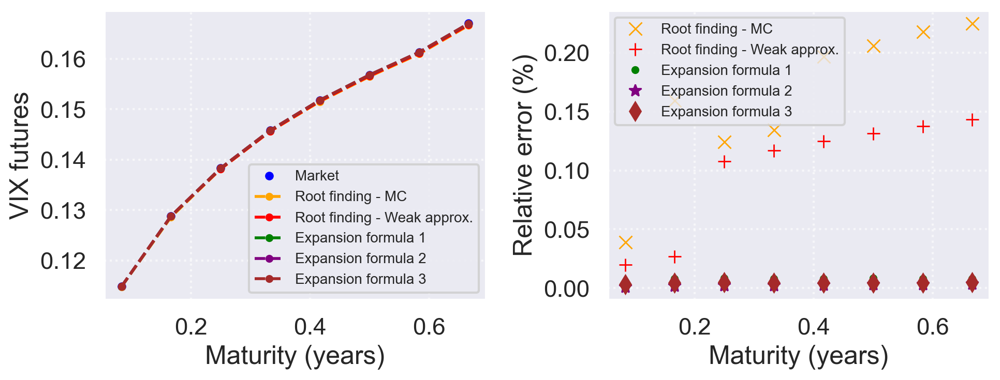

In [16]:
models_dict = {
    "Root finding - MC": df_calib_results_rf_mc,
    "Root finding - Weak approx.": df_calib_results_rf,
    "Expansion formula 1": df_calib_results_expan1,
    "Expansion formula 2": df_calib_results_expan2,
    "Expansion formula 3": df_calib_results_expan3
}

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

first_df_key = list(models_dict.keys())[0]
first_df = models_dict[first_df_key]
mkt_data = first_df.groupby('Texp')['fwd_mkt'].first().reset_index().sort_values('Texp')

axes[0].plot(mkt_data['Texp'], mkt_data['fwd_mkt'], 
             marker='o', linestyle='None', color="blue", markersize=5, label="Market")

for i, (name, df_calib) in enumerate(models_dict.items()):

    term_structure = df_calib.groupby('Texp')[['fwd_mkt', 'fwd_cal']].first().reset_index().sort_values('Texp')
    
    x_texp = term_structure['Texp']
    y_fwd_mkt = term_structure['fwd_mkt']
    y_fwd_cal = term_structure['fwd_cal']

    rel_errors = utils.rel_error(y_fwd_mkt, y_fwd_cal)

    color = colors[i % len(colors)]
    marker = markers[i % len(markers)]
    
    axes[0].plot(x_texp, y_fwd_cal, linestyle='--', marker='.', 
                 color=color, linewidth=2, label=name)
    
    axes[1].plot(x_texp, rel_errors, marker=marker, linestyle='None', 
                 color=color, label=name)


axes[0].set_xlabel('Maturity (years)')
axes[0].set_ylabel('VIX futures')
axes[0].legend(fontsize=10)
axes[0].grid(True, linestyle=':', alpha=0.6)

axes[1].set_xlabel("Maturity (years)")
axes[1].set_ylabel("Relative error (%)")
axes[1].legend(fontsize=10)
axes[1].grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

##### (2) VIX smiles

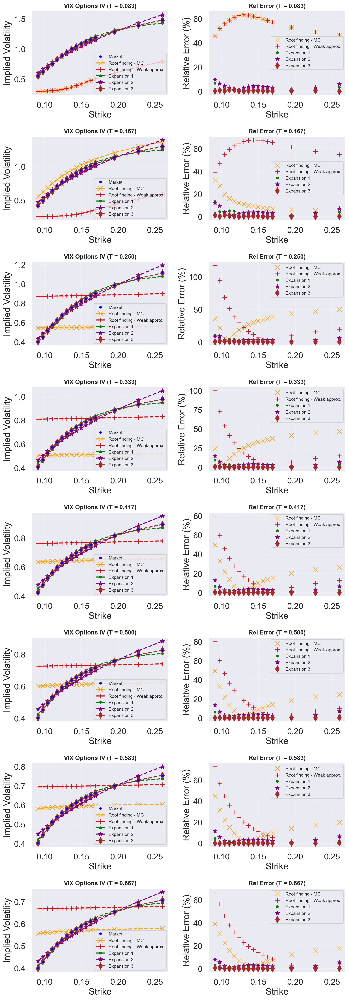

In [17]:
models_dict = {
    "Root finding - MC": df_calib_results_rf_mc,
    "Root finding - Weak approx.": df_calib_results_rf,
    "Expansion 1": df_calib_results_expan1,
    "Expansion 2": df_calib_results_expan2,
    "Expansion 3": df_calib_results_expan3
}

first_key = list(models_dict.keys())[0]
ref_df = models_dict[first_key]
groups_ref = list(ref_df.groupby('Texp'))

nrows = len(groups_ref)
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, nrows * 3.5))

if nrows == 1:
    axes_rows = np.array([axes])
else:
    axes_rows = axes

for i, (T, g_ref) in enumerate(groups_ref):
    
    ax_left = axes_rows[i, 0]
    ax_right = axes_rows[i, 1]

    strikes_ref = g_ref['strikes']
    iv_mkt_ref = g_ref['iv_mkt']
    
    if 'bid_iv_mkt' in g_ref.columns and 'ask_iv_mkt' in g_ref.columns:
        bid_ivs = g_ref['bid_iv_mkt']
        ask_ivs = g_ref['ask_iv_mkt']
        ax_left.fill_between(strikes_ref, bid_ivs, ask_ivs, 
                             color="grey", alpha=0.2, label='Bid-Ask')
    
    ax_left.plot(strikes_ref, iv_mkt_ref, marker='o', linestyle='None', 
                 color='blue', markersize=4, label="Market", zorder=10)

    ax_left.set_title(f"VIX Options IV (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_left.set_xlabel("Strike")
    ax_left.set_ylabel("Implied Volatility")
    ax_left.grid(True, linestyle=':', alpha=0.6)

    ax_right.set_title(f"Rel Error (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_right.set_xlabel("Strike")
    ax_right.set_ylabel("Relative Error (%)")
    ax_right.grid(True, linestyle=':', alpha=0.6)

    for j, (model_name, df_calib) in enumerate(models_dict.items()):
        
        g_model = df_calib[df_calib['Texp'] == T]
        
        if g_model.empty:
            continue
            
        strikes = g_model['strikes']
        iv_model = g_model['iv_cal']
        
        iv_mkt_current = g_model['iv_mkt']
        rel_error = utils.rel_error(iv_mkt_current, iv_model)
        
        color = colors[j % len(colors)]
        fmt = fmt_styles[j % len(fmt_styles)]
        marker = markers[j % len(markers)]

        ax_left.plot(strikes, iv_model, fmt, linewidth=2, 
                     color=color, label=model_name)

        ax_right.plot(strikes, rel_error, marker=marker, linestyle='None', 
                      color=color, label=model_name)

    ax_left.legend(fontsize=9, loc='best')
    ax_right.legend(fontsize=9, loc='best')

plt.tight_layout()
plt.show()

### 3.2 Use the random initial guesses for all parameters

In [18]:
eta_range = (0.01, 4.0)
xi0_range = (0.01, 0.1)
lbd_range = (0.01, 0.99)

N_SAMPLES = 100

np.random.seed(777) 
eta1_samples = np.random.uniform(eta_range[0], eta_range[1], N_SAMPLES)
eta2_samples = np.random.uniform(eta_range[0], eta_range[1], N_SAMPLES)
xi0_samples  = np.random.uniform(xi0_range[0], xi0_range[1], N_SAMPLES)
lbd_samples  = np.random.uniform(lbd_range[0], lbd_range[1], N_SAMPLES)
params_init_list = list(zip(eta1_samples, eta2_samples, xi0_samples, lbd_samples))

#### 3.2.1 The root-finding method - Weak approximation

In [19]:
results_rf_random = {}

for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    best_result_for_T = results_rf[T]
    lowest_cost = best_result_for_T['cost']

    for params_init in params_init_list:

        try:

            res = calibration.calib_one_maturity_proxy(
                T=T,
                kappa=kappa_list,
                fwd_mkt=fwd_mkt,
                iv_mkt=mid_ivs,
                params_init=params_init,
                params_num=4,
                n_gauss=N_GAUSS
            )

            current_cost = res.get('cost')

            if current_cost is not None and np.isfinite(current_cost) and current_cost < lowest_cost:
                lowest_cost = current_cost
                best_result_for_T = res
                best_result_for_T['initial_guess'] = params_init
        
        except (ValueError, OverflowError, Exception):
            continue
    
    if best_result_for_T is not None:
        print(f"  -> Best Cost for T={T:.3f}: {lowest_cost:.6f}")
    else:
        print(f"  -> Warning: Calibration failed for T={T:.3f}")

    results_rf_random[T] = best_result_for_T

df_results_params_rf_random = pd.DataFrame(results_rf_random).T

if not df_results_params_rf_random.empty:
    df_results_params_rf_random = df_results_params_rf_random.sort_index()
    df_results_params_rf_random.index.name = 'T'
    df_results_params_rf_random.index = df_results_params_rf_random.index.astype(float)  

    if 'T' in df_results_params_rf_random.columns:
        df_results_params_rf_random = df_results_params_rf_random.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_rf_random)
        
    df_calib_results_rf_random = calibration.repricing_calibrated_model_proxy(df, df_results_params_rf_random)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==
  -> Best Cost for T=0.083: 0.033967
== Calibrating T = 0.167, the number of data points: 16 ==


c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: divide by zero encountered in divide
  (price - market) / market)
c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: invalid value encountered in divide
  (price - market) / market)


  -> Best Cost for T=0.167: 0.037192
== Calibrating T = 0.250, the number of data points: 16 ==
  -> Best Cost for T=0.250: 0.015077
== Calibrating T = 0.333, the number of data points: 16 ==
  -> Best Cost for T=0.333: 0.007988
== Calibrating T = 0.417, the number of data points: 16 ==
  -> Best Cost for T=0.417: 0.019044
== Calibrating T = 0.500, the number of data points: 16 ==
  -> Best Cost for T=0.500: 0.015000
== Calibrating T = 0.583, the number of data points: 16 ==
  -> Best Cost for T=0.583: 0.011077
== Calibrating T = 0.667, the number of data points: 16 ==
  -> Best Cost for T=0.667: 0.023814

Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333    0.397137    2.407433  0.1  0.014617  0.800441  0.033967   
0.166667    0.063107    1.388291  0.1  0.019881  0.396335  0.037192   
0.250000    0.063107    1.388291  0.1  0.023822  0.396

#### 3.2.4 The implied volatility expansion - Formula 3

In [20]:
formula = 3

results_expan3_random = {}
for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    best_result_for_T = results_expan3[T]
    lowest_cost = best_result_for_T['cost']

    for params_init in params_init_list:

        try:

            res = calibration.calib_one_maturity_expan(
                T=T,
                kappa=kappa_list,
                fwd_mkt=fwd_mkt,
                iv_mkt=mid_ivs,
                params_init=params_init,
                params_num=4,
                n_max=N_MAX,
                n_mc=N_MC,
                formula=formula
            )

            current_cost = res.get('cost')

            if current_cost is not None and np.isfinite(current_cost) and current_cost < lowest_cost:
                lowest_cost = current_cost
                best_result_for_T = res
                best_result_for_T['initial_guess'] = params_init
        
        except (ValueError, OverflowError, Exception):
            continue
    
    if best_result_for_T is not None:
        print(f"  -> Best Cost for T={T:.3f}: {lowest_cost:.6f}")
    else:
        print(f"  -> Warning: Calibration failed for T={T:.3f}")

    results_expan3_random[T] = best_result_for_T

df_results_params_expan3_random = pd.DataFrame(results_expan3_random).T

if not df_results_params_expan3_random.empty:
    df_results_params_expan3_random = df_results_params_expan3_random.sort_index()
    df_results_params_expan3_random.index.name = 'T'
    df_results_params_expan3_random.index = df_results_params_expan3_random.index.astype(float)  

    if 'T' in df_results_params_expan3_random.columns:
        df_results_params_expan3_random = df_results_params_expan3_random.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_expan3_random)
        
    df_calib_results_expan3_random = calibration.repricing_calibrated_model_expan(df, df_results_params_expan3_random, formula)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==


c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\hermite_expansion.py:886: RuntimeWarning: divide by zero encountered in divide
  iv2 = extra_term / (np.exp(x0) * np.sqrt(T) * norm.pdf(B))


  -> Best Cost for T=0.083: 0.000330
== Calibrating T = 0.167, the number of data points: 16 ==
  -> Best Cost for T=0.167: 0.000160
== Calibrating T = 0.250, the number of data points: 16 ==
  -> Best Cost for T=0.250: 0.000153
== Calibrating T = 0.333, the number of data points: 16 ==
  -> Best Cost for T=0.333: 0.000031
== Calibrating T = 0.417, the number of data points: 16 ==
  -> Best Cost for T=0.417: 0.000009
== Calibrating T = 0.500, the number of data points: 16 ==
  -> Best Cost for T=0.500: 0.000008
== Calibrating T = 0.583, the number of data points: 16 ==
  -> Best Cost for T=0.583: 0.000009
== Calibrating T = 0.667, the number of data points: 16 ==
  -> Best Cost for T=0.667: 0.000010

Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333    0.201564    1.695823  0.1  0.014121  0.713324   0.00033   
0.166667    0.165639    1.623

#### 3.2.3 Calibration results

##### (1) VIX futures prices

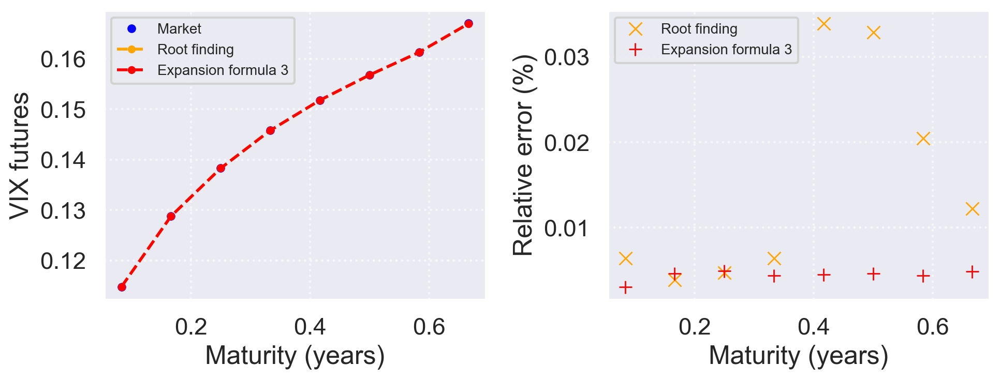

In [21]:
models_dict = {
    "Root finding": df_calib_results_rf_random,
    "Expansion formula 3": df_calib_results_expan3_random
}

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

first_df_key = list(models_dict.keys())[0]
first_df = models_dict[first_df_key]
mkt_data = first_df.groupby('Texp')['fwd_mkt'].first().reset_index().sort_values('Texp')

axes[0].plot(mkt_data['Texp'], mkt_data['fwd_mkt'],  
             marker='o', linestyle='None', color="blue", markersize=5, label="Market")

for i, (name, df_calib) in enumerate(models_dict.items()):

    term_structure = df_calib.groupby('Texp')[['fwd_mkt', 'fwd_cal']].first().reset_index().sort_values('Texp')
    
    x_texp = term_structure['Texp']
    y_fwd_mkt = term_structure['fwd_mkt']
    y_fwd_cal = term_structure['fwd_cal']

    rel_errors = utils.rel_error(y_fwd_mkt, y_fwd_cal)

    color = colors[i % len(colors)]
    marker = markers[i % len(markers)]
    
    axes[0].plot(x_texp, y_fwd_cal, linestyle='--', marker='.', 
                 color=color, linewidth=2, label=name)
    
    axes[1].plot(x_texp, rel_errors, marker=marker, linestyle='None', 
                 color=color, label=name)


axes[0].set_xlabel('Maturity (years)')
axes[0].set_ylabel('VIX futures')
axes[0].legend(fontsize=10)
axes[0].grid(True, linestyle=':', alpha=0.6)

axes[1].set_xlabel("Maturity (years)")
axes[1].set_ylabel("Relative error (%)")
axes[1].legend(fontsize=10)
axes[1].grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

##### (2) VIX smiles

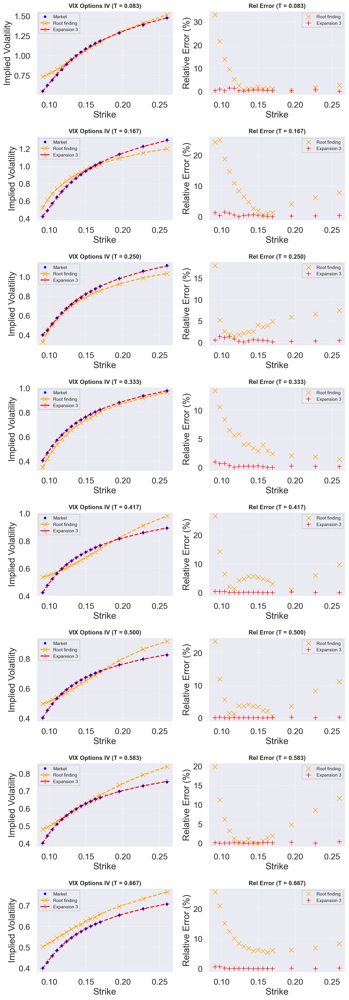

In [22]:
models_dict = {
    "Root finding": df_calib_results_rf_random,
    "Expansion 3": df_calib_results_expan3_random
}

first_key = list(models_dict.keys())[0]
ref_df = models_dict[first_key]
groups_ref = list(ref_df.groupby('Texp'))

nrows = len(groups_ref)
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, nrows * 3.5))

if nrows == 1:
    axes_rows = np.array([axes])
else:
    axes_rows = axes

for i, (T, g_ref) in enumerate(groups_ref):
    
    ax_left = axes_rows[i, 0]
    ax_right = axes_rows[i, 1]

    strikes_ref = g_ref['strikes']
    iv_mkt_ref = g_ref['iv_mkt']
    
    if 'bid_iv_mkt' in g_ref.columns and 'ask_iv_mkt' in g_ref.columns:
        bid_ivs = g_ref['bid_iv_mkt']
        ask_ivs = g_ref['ask_iv_mkt']
        ax_left.fill_between(strikes_ref, bid_ivs, ask_ivs, 
                             color="grey", alpha=0.2, label='Bid-Ask')
    
    ax_left.plot(strikes_ref, iv_mkt_ref, marker='o', linestyle='None', 
                 color='blue', markersize=4, label="Market", zorder=10)

    ax_left.set_title(f"VIX Options IV (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_left.set_xlabel("Strike")
    ax_left.set_ylabel("Implied Volatility")
    ax_left.grid(True, linestyle=':', alpha=0.6)

    ax_right.set_title(f"Rel Error (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_right.set_xlabel("Strike")
    ax_right.set_ylabel("Relative Error (%)")
    ax_right.grid(True, linestyle=':', alpha=0.6)

    for j, (model_name, df_calib) in enumerate(models_dict.items()):
        
        g_model = df_calib[df_calib['Texp'] == T]
        
        if g_model.empty:
            continue
            
        strikes = g_model['strikes']
        iv_model = g_model['iv_cal']
        
        iv_mkt_current = g_model['iv_mkt']
        rel_error = utils.rel_error(iv_mkt_current, iv_model)
        
        color = colors[j % len(colors)]
        fmt = fmt_styles[j % len(fmt_styles)]
        marker = markers[j % len(markers)]

        ax_left.plot(strikes, iv_model, fmt, linewidth=2, 
                     color=color, label=model_name)

        ax_right.plot(strikes, rel_error, marker=marker, linestyle='None', 
                      color=color, label=model_name)

    ax_left.legend(fontsize=9, loc='best')
    ax_right.legend(fontsize=9, loc='best')

plt.tight_layout()
plt.show()

## 4. Cross-checks

### 4.1 Insert parameters calibrated from the root-finding method into the implied volatility approximation formula

In [23]:
formula = 3

df_calib_results_proxy_expan3 = calibration.repricing_calibrated_model_expan(df, df_results_params_rf_random, formula)

##### (1) VIX futures prices

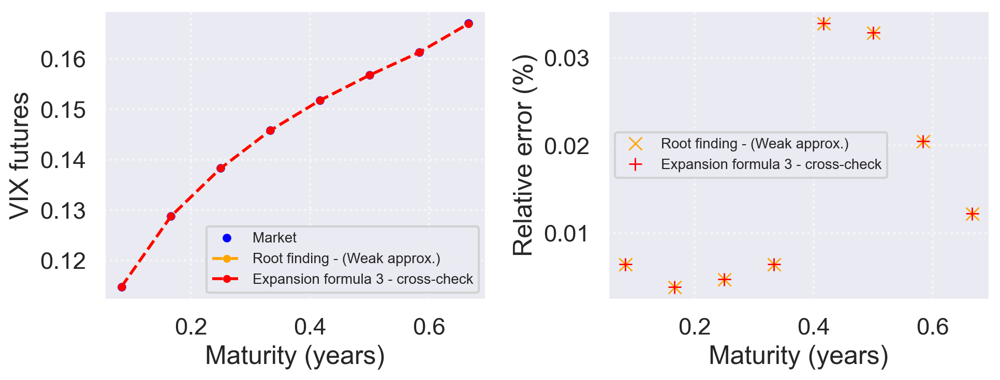

In [24]:
models_dict = {
    "Root finding - (Weak approx.)": df_calib_results_rf_random,
    "Expansion formula 3 - cross-check": df_calib_results_proxy_expan3
}

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

first_df_key = list(models_dict.keys())[0]
first_df = models_dict[first_df_key]
mkt_data = first_df.groupby('Texp')['fwd_mkt'].first().reset_index().sort_values('Texp')

axes[0].plot(mkt_data['Texp'], mkt_data['fwd_mkt'], 
             marker='o', linestyle='None', color="blue", markersize=5, label="Market")

for i, (name, df_calib) in enumerate(models_dict.items()):

    term_structure = df_calib.groupby('Texp')[['fwd_mkt', 'fwd_cal']].first().reset_index().sort_values('Texp')
    
    x_texp = term_structure['Texp']
    y_fwd_mkt = term_structure['fwd_mkt']
    y_fwd_cal = term_structure['fwd_cal']

    rel_errors = utils.rel_error(y_fwd_mkt, y_fwd_cal)

    color = colors[i % len(colors)]
    marker = markers[i % len(markers)]
    
    axes[0].plot(x_texp, y_fwd_cal, linestyle='--', marker='.', 
                 color=color, linewidth=2, label=name)
    
    axes[1].plot(x_texp, rel_errors, marker=marker, linestyle='None', 
                 color=color, label=name)


axes[0].set_xlabel('Maturity (years)')
axes[0].set_ylabel('VIX futures')
axes[0].legend(fontsize=10)
axes[0].grid(True, linestyle=':', alpha=0.6)

axes[1].set_xlabel("Maturity (years)")
axes[1].set_ylabel("Relative error (%)")
axes[1].legend(fontsize=10)
axes[1].grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

##### (2) VIX smiles

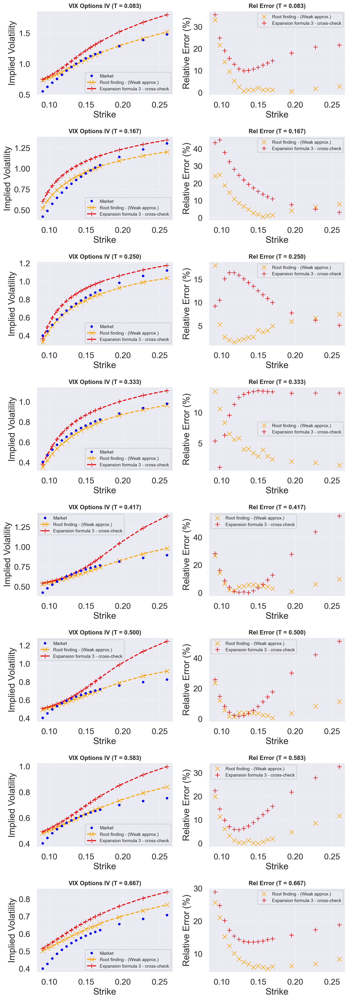

In [25]:
models_dict = {
    "Root finding - (Weak approx.)": df_calib_results_rf_random,
    "Expansion formula 3 - cross-check": df_calib_results_proxy_expan3
}

first_key = list(models_dict.keys())[0]
ref_df = models_dict[first_key]
groups_ref = list(ref_df.groupby('Texp'))

nrows = len(groups_ref)
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, nrows * 3.5))

if nrows == 1:
    axes_rows = np.array([axes])
else:
    axes_rows = axes

for i, (T, g_ref) in enumerate(groups_ref):
    
    ax_left = axes_rows[i, 0]
    ax_right = axes_rows[i, 1]

    strikes_ref = g_ref['strikes']
    iv_mkt_ref = g_ref['iv_mkt']
    
    if 'bid_iv_mkt' in g_ref.columns and 'ask_iv_mkt' in g_ref.columns:
        bid_ivs = g_ref['bid_iv_mkt']
        ask_ivs = g_ref['ask_iv_mkt']
        ax_left.fill_between(strikes_ref, bid_ivs, ask_ivs, 
                             color="grey", alpha=0.2, label='Bid-Ask')
    
    ax_left.plot(strikes_ref, iv_mkt_ref, marker='o', linestyle='None', 
                 color='blue', markersize=4, label="Market", zorder=10)

    ax_left.set_title(f"VIX Options IV (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_left.set_xlabel("Strike")
    ax_left.set_ylabel("Implied Volatility")
    ax_left.grid(True, linestyle=':', alpha=0.6)

    ax_right.set_title(f"Rel Error (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_right.set_xlabel("Strike")
    ax_right.set_ylabel("Relative Error (%)")
    ax_right.grid(True, linestyle=':', alpha=0.6)

    for j, (model_name, df_calib) in enumerate(models_dict.items()):
        
        g_model = df_calib[df_calib['Texp'] == T]
        
        if g_model.empty:
            continue
            
        strikes = g_model['strikes']
        iv_model = g_model['iv_cal']
        
        iv_mkt_current = g_model['iv_mkt']
        rel_error = utils.rel_error(iv_mkt_current, iv_model)
        
        color = colors[j % len(colors)]
        fmt = fmt_styles[j % len(fmt_styles)]
        marker = markers[j % len(markers)]

        ax_left.plot(strikes, iv_model, fmt, linewidth=2, 
                     color=color, label=model_name)

        ax_right.plot(strikes, rel_error, marker=marker, linestyle='None', 
                      color=color, label=model_name)

    ax_left.legend(fontsize=9, loc='best')
    ax_right.legend(fontsize=9, loc='best')

plt.tight_layout()
plt.show()

### 4.2 Insert parameters calibrated from the appximation formula into the root-finding method

In [26]:
df_calib_results_expan3_proxy = calibration.repricing_calibrated_model(df, df_results_params_expan3_random)

##### (1) VIX futures prices

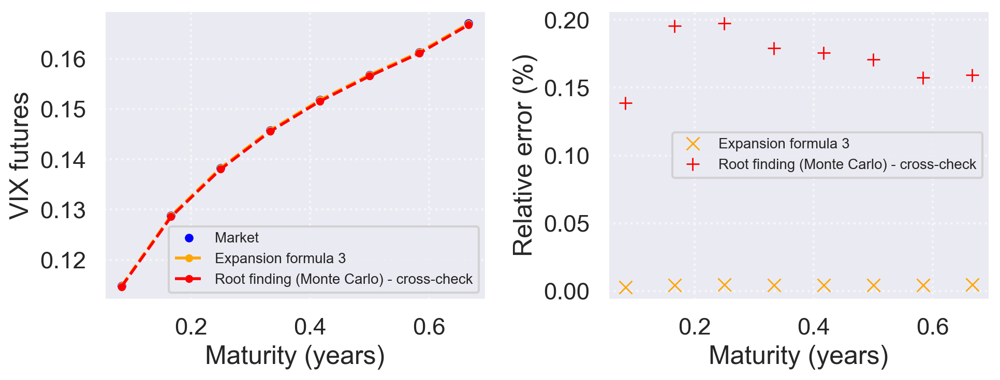

In [27]:
models_dict = {
    "Expansion formula 3": df_calib_results_expan3_random,
    "Root finding (Monte Carlo) - cross-check": df_calib_results_expan3_proxy
}

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

first_df_key = list(models_dict.keys())[0]
first_df = models_dict[first_df_key]
mkt_data = first_df.groupby('Texp')['fwd_mkt'].first().reset_index().sort_values('Texp')

axes[0].plot(mkt_data['Texp'], mkt_data['fwd_mkt'], 
             marker='o', linestyle='None', color="blue", markersize=5, label="Market")

for i, (name, df_calib) in enumerate(models_dict.items()):

    term_structure = df_calib.groupby('Texp')[['fwd_mkt', 'fwd_cal']].first().reset_index().sort_values('Texp')
    
    x_texp = term_structure['Texp']
    y_fwd_mkt = term_structure['fwd_mkt']
    y_fwd_cal = term_structure['fwd_cal']

    rel_errors = utils.rel_error(y_fwd_mkt, y_fwd_cal)

    color = colors[i % len(colors)]
    marker = markers[i % len(markers)]
    
    axes[0].plot(x_texp, y_fwd_cal, linestyle='--', marker='.', 
                 color=color, linewidth=2, label=name)
    
    axes[1].plot(x_texp, rel_errors, marker=marker, linestyle='None', 
                 color=color, label=name)


axes[0].set_xlabel('Maturity (years)')
axes[0].set_ylabel('VIX futures')
axes[0].legend(fontsize=10)
axes[0].grid(True, linestyle=':', alpha=0.6)

axes[1].set_xlabel("Maturity (years)")
axes[1].set_ylabel("Relative error (%)")
axes[1].legend(fontsize=10)
axes[1].grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

##### (2) VIX smiles

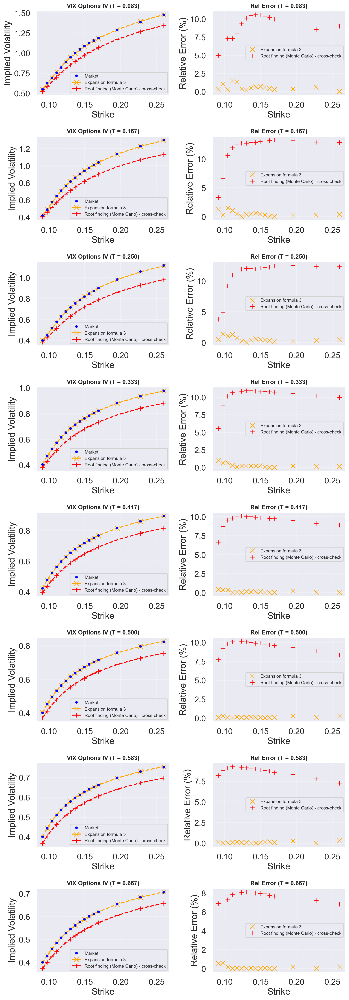

In [28]:
models_dict = {
    "Expansion formula 3": df_calib_results_expan3_random,
    "Root finding (Monte Carlo) - cross-check": df_calib_results_expan3_proxy
}

first_key = list(models_dict.keys())[0]
ref_df = models_dict[first_key]
groups_ref = list(ref_df.groupby('Texp'))

nrows = len(groups_ref)
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, nrows * 3.5))

if nrows == 1:
    axes_rows = np.array([axes])
else:
    axes_rows = axes

for i, (T, g_ref) in enumerate(groups_ref):
    
    ax_left = axes_rows[i, 0]
    ax_right = axes_rows[i, 1]

    strikes_ref = g_ref['strikes']
    iv_mkt_ref = g_ref['iv_mkt']
    
    if 'bid_iv_mkt' in g_ref.columns and 'ask_iv_mkt' in g_ref.columns:
        bid_ivs = g_ref['bid_iv_mkt']
        ask_ivs = g_ref['ask_iv_mkt']
        ax_left.fill_between(strikes_ref, bid_ivs, ask_ivs, 
                             color="grey", alpha=0.2, label='Bid-Ask')
    
    ax_left.plot(strikes_ref, iv_mkt_ref, marker='o', linestyle='None', 
                 color='blue', markersize=4, label="Market", zorder=10)

    ax_left.set_title(f"VIX Options IV (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_left.set_xlabel("Strike")
    ax_left.set_ylabel("Implied Volatility")
    ax_left.grid(True, linestyle=':', alpha=0.6)

    ax_right.set_title(f"Rel Error (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_right.set_xlabel("Strike")
    ax_right.set_ylabel("Relative Error (%)")
    ax_right.grid(True, linestyle=':', alpha=0.6)

    for j, (model_name, df_calib) in enumerate(models_dict.items()):
        
        g_model = df_calib[df_calib['Texp'] == T]
        
        if g_model.empty:
            continue
            
        strikes = g_model['strikes']
        iv_model = g_model['iv_cal']
        
        iv_mkt_current = g_model['iv_mkt']
        rel_error = utils.rel_error(iv_mkt_current, iv_model)
        
        color = colors[j % len(colors)]
        fmt = fmt_styles[j % len(fmt_styles)]
        marker = markers[j % len(markers)]

        ax_left.plot(strikes, iv_model, fmt, linewidth=2, 
                     color=color, label=model_name)

        ax_right.plot(strikes, rel_error, marker=marker, linestyle='None', 
                      color=color, label=model_name)

    ax_left.legend(fontsize=9, loc='best')
    ax_right.legend(fontsize=9, loc='best')

plt.tight_layout()
plt.show()

### 4.3 Insert parameters reported in the paper into both the root-finding method and the implied volatility approximation formula

In [29]:
results_params_old = {
    "T" : [1 / 12, 2 / 12, 3 / 12, 4 / 12],
    "vol_of_vol1": [1.899, 1.887, 1.684, 1.410],
    "vol_of_vol2": [0.1937, 0.1481, 0.1482, 0.1166],
    "rate": [0.1, 0.1, 0.1, 0.1],
    "xi0": [1.449 * 10**(-2), 2.074 * 10**(-2), 2.643 * 10**(-2), 2.871 * 10**(-2)],
    "lbd": [0.3208, 0.4849, 0.5614, 0.6511]
}

df_results_params_old = pd.DataFrame(results_params_old)
df_results_params_old.set_index("T", inplace=True)

df_calib_results_old = calibration.repricing_calibrated_model(df, df_results_params_old)
df_calib_results_proxy_old = calibration.repricing_calibrated_model_proxy(df, df_results_params_old)
df_calib_results_expan_old = calibration.repricing_calibrated_model_expan(df, df_results_params_old, formula)

##### (1) VIX futures prices

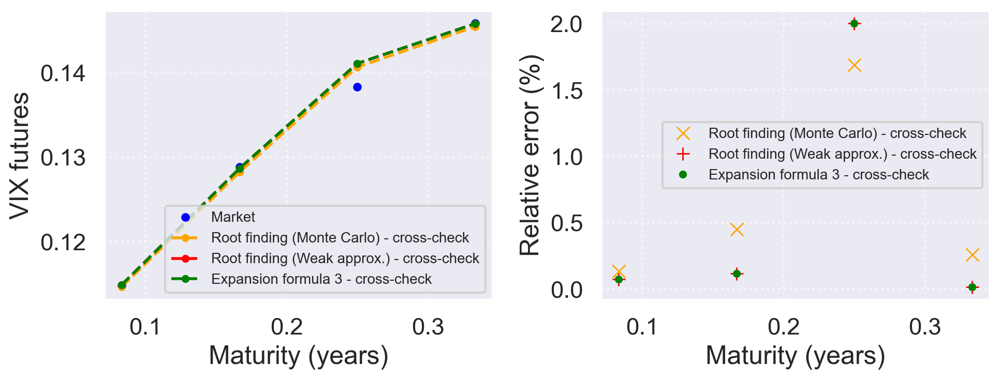

In [30]:
models_dict = {
    "Root finding (Monte Carlo) - cross-check": df_calib_results_old,
    "Root finding (Weak approx.) - cross-check": df_calib_results_proxy_old,
    "Expansion formula 3 - cross-check": df_calib_results_expan_old
}

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

first_df_key = list(models_dict.keys())[0]
first_df = models_dict[first_df_key]
mkt_data = first_df.groupby('Texp')['fwd_mkt'].first().reset_index().sort_values('Texp')

axes[0].plot(mkt_data['Texp'], mkt_data['fwd_mkt'], 
             marker='o', linestyle='None', color="blue", markersize=5, label="Market")

for i, (name, df_calib) in enumerate(models_dict.items()):

    term_structure = df_calib.groupby('Texp')[['fwd_mkt', 'fwd_cal']].first().reset_index().sort_values('Texp')
    
    x_texp = term_structure['Texp']
    y_fwd_mkt = term_structure['fwd_mkt']
    y_fwd_cal = term_structure['fwd_cal']

    rel_errors = utils.rel_error(y_fwd_mkt, y_fwd_cal)

    color = colors[i % len(colors)]
    marker = markers[i % len(markers)]
    
    axes[0].plot(x_texp, y_fwd_cal, linestyle='--', marker='.', 
                 color=color, linewidth=2, label=name)
    
    axes[1].plot(x_texp, rel_errors, marker=marker, linestyle='None', 
                 color=color, label=name)


axes[0].set_xlabel('Maturity (years)')
axes[0].set_ylabel('VIX futures')
axes[0].legend(fontsize=10)
axes[0].grid(True, linestyle=':', alpha=0.6)

axes[1].set_xlabel("Maturity (years)")
axes[1].set_ylabel("Relative error (%)")
axes[1].legend(fontsize=10)
axes[1].grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

##### (2) VIX smiles

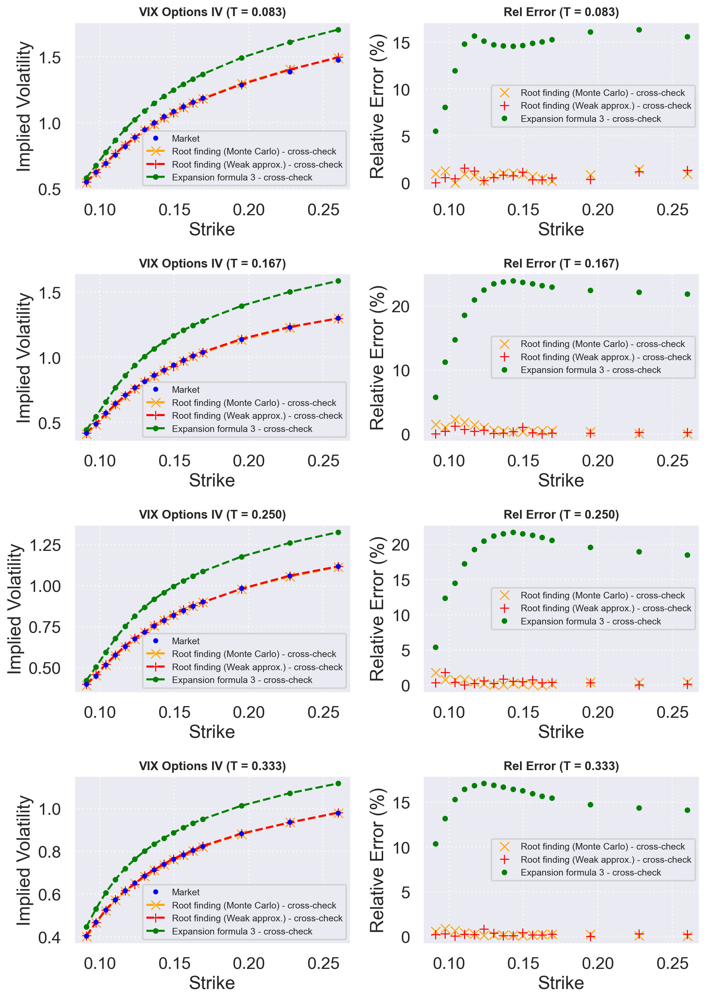

In [31]:
models_dict = {
    "Root finding (Monte Carlo) - cross-check": df_calib_results_old,
    "Root finding (Weak approx.) - cross-check": df_calib_results_proxy_old,
    "Expansion formula 3 - cross-check": df_calib_results_expan_old
}

first_key = list(models_dict.keys())[0]
ref_df = models_dict[first_key]
groups_ref = list(ref_df.groupby('Texp'))

nrows = len(groups_ref)
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, nrows * 3.5))

if nrows == 1:
    axes_rows = np.array([axes])
else:
    axes_rows = axes

for i, (T, g_ref) in enumerate(groups_ref):
    
    ax_left = axes_rows[i, 0]
    ax_right = axes_rows[i, 1]

    strikes_ref = g_ref['strikes']
    iv_mkt_ref = g_ref['iv_mkt']
    
    if 'bid_iv_mkt' in g_ref.columns and 'ask_iv_mkt' in g_ref.columns:
        bid_ivs = g_ref['bid_iv_mkt']
        ask_ivs = g_ref['ask_iv_mkt']
        ax_left.fill_between(strikes_ref, bid_ivs, ask_ivs, 
                             color="grey", alpha=0.2, label='Bid-Ask')
    
    ax_left.plot(strikes_ref, iv_mkt_ref, marker='o', linestyle='None', 
                 color='blue', markersize=4, label="Market", zorder=10)

    ax_left.set_title(f"VIX Options IV (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_left.set_xlabel("Strike")
    ax_left.set_ylabel("Implied Volatility")
    ax_left.grid(True, linestyle=':', alpha=0.6)

    ax_right.set_title(f"Rel Error (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_right.set_xlabel("Strike")
    ax_right.set_ylabel("Relative Error (%)")
    ax_right.grid(True, linestyle=':', alpha=0.6)

    for j, (model_name, df_calib) in enumerate(models_dict.items()):
        
        g_model = df_calib[df_calib['Texp'] == T]
        
        if g_model.empty:
            continue
            
        strikes = g_model['strikes']
        iv_model = g_model['iv_cal']
        
        iv_mkt_current = g_model['iv_mkt']
        rel_error = utils.rel_error(iv_mkt_current, iv_model)
        
        color = colors[j % len(colors)]
        fmt = fmt_styles[j % len(fmt_styles)]
        marker = markers[j % len(markers)]

        ax_left.plot(strikes, iv_model, fmt, linewidth=2, 
                     color=color, label=model_name)

        ax_right.plot(strikes, rel_error, marker=marker, linestyle='None', 
                      color=color, label=model_name)

    ax_left.legend(fontsize=9, loc='best')
    ax_right.legend(fontsize=9, loc='best')

plt.tight_layout()
plt.show()

## 5. Use the calibrated parameters from the implied volatility approximation as the initial guess

### 5.1 Monte Carlo method

In [32]:
results_rf_mc_re = {}

for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    current_params_guess = df_results_params_expan3_random.loc[T, ['vol_of_vol1', 'vol_of_vol2', 'xi0', 'lbd']].tolist()

    res = calibration.calib_one_maturity(
        T=T,
        kappa=kappa_list,
        fwd_mkt=fwd_mkt,
        iv_mkt=mid_ivs,
        params_init=current_params_guess,
        params_num=4
    )
    
    res['initial_guess'] = current_params_guess.copy()
    results_rf_mc_re[T] = res

df_results_params_rf_mc_re = pd.DataFrame(results_rf_mc_re).T

if not df_results_params_rf_mc_re.empty:
    df_results_params_rf_mc_re = df_results_params_rf_mc_re.sort_index()
    df_results_params_rf_mc_re.index.name = 'T'
    df_results_params_rf_mc_re.index = df_results_params_rf_mc_re.index.astype(float)  

    if 'T' in df_results_params_rf_mc_re.columns:
        df_results_params_rf_mc_re = df_results_params_rf_mc_re.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_rf_mc_re)
        
    df_calib_results_rf_mc_re = calibration.repricing_calibrated_model(df, df_results_params_rf_mc_re)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==
== Calibrating T = 0.167, the number of data points: 16 ==
== Calibrating T = 0.250, the number of data points: 16 ==
== Calibrating T = 0.333, the number of data points: 16 ==


c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: divide by zero encountered in divide
  (price - market) / market)
c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: invalid value encountered in divide
  (price - market) / market)


== Calibrating T = 0.417, the number of data points: 16 ==
== Calibrating T = 0.500, the number of data points: 16 ==
== Calibrating T = 0.583, the number of data points: 16 ==


c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: divide by zero encountered in divide
  (price - market) / market)
c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: invalid value encountered in divide
  (price - market) / market)


== Calibrating T = 0.667, the number of data points: 16 ==


c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: divide by zero encountered in divide
  (price - market) / market)
c:\Users\Spencer\Desktop\Chapter 2\2. Code\version_6\utils.py:188: RuntimeWarning: invalid value encountered in divide
  (price - market) / market)



Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333    0.201564    1.695823  0.1  0.014132  0.713324  0.074747   
0.166667    0.165639    1.623275  0.1  0.019204    0.5861  0.102846   
0.250000    0.173022     1.49792  0.1  0.023218  0.518956  0.068651   
0.333333    0.142572    1.293894  0.1  0.026768  0.405799  0.036866   
0.416667    0.146567    1.208486  0.1  0.029733  0.360109  0.033095   
0.500000    1.142601    0.127267  0.1  0.032212  0.678054  0.028682   
0.583333    0.121007    1.101455  0.1  0.035277  0.269885  0.003591   
0.666667    0.161623    1.054611  0.1  0.037115  0.300588  0.013848   

                                              initial_guess  
T                                                            
0.083333  [0.20156415368243497, 1.695822995604103, 0.014...  
0.166667  [0.16563885542592294, 1.6232746861538614, 0.

### 5.2 Weak approximation

In [33]:
results_rf_re = {}

for T, g in df.groupby('Texp'):
    
    print(f"== Calibrating T = {T:.3f}, the number of data points: {len(g)} ==")

    fwd_mkt = g['Fwd'].unique()[0]
    kappa_list = g['Strike'].to_numpy()
    mid_ivs     = g['Mid'].to_numpy()

    current_params_guess = df_results_params_expan3_random.loc[T, ['vol_of_vol1', 'vol_of_vol2', 'xi0', 'lbd']].tolist()
    
    res = calibration.calib_one_maturity_proxy(
        T=T,
        kappa=kappa_list,
        fwd_mkt=fwd_mkt,
        iv_mkt=mid_ivs,
        params_init=current_params_guess,
        params_num=4,
        n_gauss=N_GAUSS
    )
    
    res['initial_guess'] = current_params_guess.copy()
    results_rf_re[T] = res

df_results_params_rf_re = pd.DataFrame(results_rf_re).T

if not df_results_params_rf_re.empty:
    df_results_params_rf_re = df_results_params_rf_re.sort_index()
    df_results_params_rf_re.index.name = 'T'
    df_results_params_rf_re.index = df_results_params_rf_re.index.astype(float)  

    if 'T' in df_results_params_rf_re.columns:
        df_results_params_rf_re = df_results_params_rf_re.drop(columns=['T']) 

    print("\nCalibration results (Parameters) - Fixed Guess:")
    print(df_results_params_rf_re)
        
    df_calib_results_rf_re = calibration.repricing_calibrated_model(df, df_results_params_rf_re)
else:
    print("\nNo calibration results obtained (Fixed Guess). Skipping plots.")

== Calibrating T = 0.083, the number of data points: 16 ==
== Calibrating T = 0.167, the number of data points: 16 ==
== Calibrating T = 0.250, the number of data points: 16 ==
== Calibrating T = 0.333, the number of data points: 16 ==
== Calibrating T = 0.417, the number of data points: 16 ==
== Calibrating T = 0.500, the number of data points: 16 ==
== Calibrating T = 0.583, the number of data points: 16 ==
== Calibrating T = 0.667, the number of data points: 16 ==

Calibration results (Parameters) - Fixed Guess:
         vol_of_vol1 vol_of_vol2 rate       xi0       lbd      cost  \
T                                                                     
0.083333    0.201564    1.695823  0.1  0.014121  0.713324  0.078232   
0.166667    0.165639    1.623275  0.1  0.019179    0.5861  0.102548   
0.250000    0.283349     1.49792  0.1  0.023796  0.518956  0.043696   
0.333333    0.142572    1.292757  0.1  0.026645  0.413057  0.045703   
0.416667    0.146103    1.208479  0.1  0.029746  0.36

### 5.3 Calibration results

##### (1) VIX futures prices

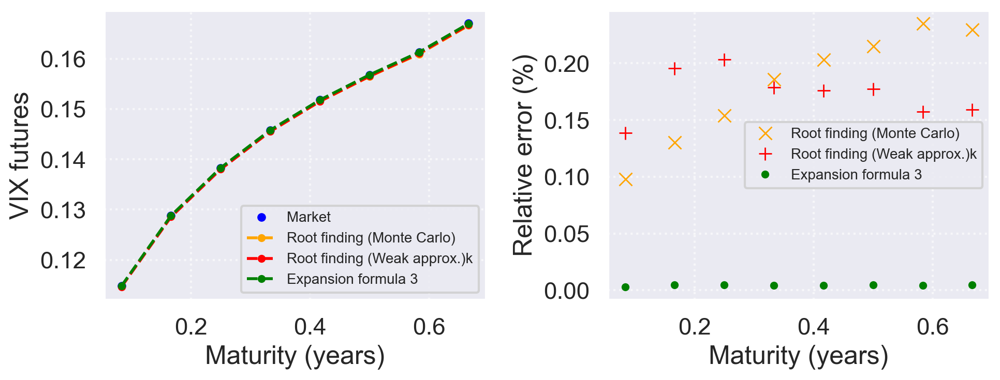

In [34]:
models_dict = {
    "Root finding (Monte Carlo)": df_calib_results_rf_mc_re,
    "Root finding (Weak approx.)k": df_calib_results_rf_re,
    "Expansion formula 3": df_calib_results_expan3_random
}

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

first_df_key = list(models_dict.keys())[0]
first_df = models_dict[first_df_key]
mkt_data = first_df.groupby('Texp')['fwd_mkt'].first().reset_index().sort_values('Texp')

axes[0].plot(mkt_data['Texp'], mkt_data['fwd_mkt'], 
             marker='o', linestyle='None', color="blue", markersize=5, label="Market")

for i, (name, df_calib) in enumerate(models_dict.items()):

    term_structure = df_calib.groupby('Texp')[['fwd_mkt', 'fwd_cal']].first().reset_index().sort_values('Texp')
    
    x_texp = term_structure['Texp']
    y_fwd_mkt = term_structure['fwd_mkt']
    y_fwd_cal = term_structure['fwd_cal']

    rel_errors = utils.rel_error(y_fwd_mkt, y_fwd_cal)

    color = colors[i % len(colors)]
    marker = markers[i % len(markers)]
    
    axes[0].plot(x_texp, y_fwd_cal, linestyle='--', marker='.', 
                 color=color, linewidth=2, label=name)
    
    axes[1].plot(x_texp, rel_errors, marker=marker, linestyle='None', 
                 color=color, label=name)


axes[0].set_xlabel('Maturity (years)')
axes[0].set_ylabel('VIX futures')
axes[0].legend(fontsize=10)
axes[0].grid(True, linestyle=':', alpha=0.6)

axes[1].set_xlabel("Maturity (years)")
axes[1].set_ylabel("Relative error (%)")
axes[1].legend(fontsize=10)
axes[1].grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

##### (2) VIX smiles

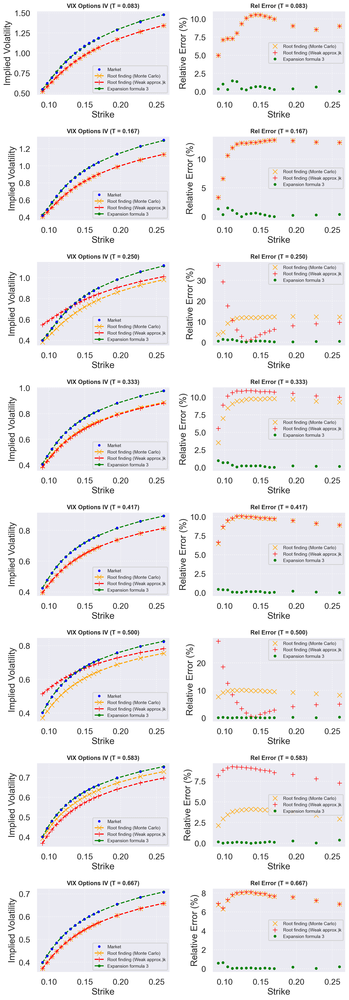

In [35]:
models_dict = {
    "Root finding (Monte Carlo)": df_calib_results_rf_mc_re,
    "Root finding (Weak approx.)k": df_calib_results_rf_re,
    "Expansion formula 3": df_calib_results_expan3_random
}

first_key = list(models_dict.keys())[0]
ref_df = models_dict[first_key]
groups_ref = list(ref_df.groupby('Texp'))

nrows = len(groups_ref)
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, nrows * 3.5))

if nrows == 1:
    axes_rows = np.array([axes])
else:
    axes_rows = axes

for i, (T, g_ref) in enumerate(groups_ref):
    
    ax_left = axes_rows[i, 0]
    ax_right = axes_rows[i, 1]

    strikes_ref = g_ref['strikes']
    iv_mkt_ref = g_ref['iv_mkt']
    
    if 'bid_iv_mkt' in g_ref.columns and 'ask_iv_mkt' in g_ref.columns:
        bid_ivs = g_ref['bid_iv_mkt']
        ask_ivs = g_ref['ask_iv_mkt']
        ax_left.fill_between(strikes_ref, bid_ivs, ask_ivs, 
                             color="grey", alpha=0.2, label='Bid-Ask')
    
    ax_left.plot(strikes_ref, iv_mkt_ref, marker='o', linestyle='None', 
                 color='blue', markersize=4, label="Market", zorder=10)

    ax_left.set_title(f"VIX Options IV (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_left.set_xlabel("Strike")
    ax_left.set_ylabel("Implied Volatility")
    ax_left.grid(True, linestyle=':', alpha=0.6)

    ax_right.set_title(f"Rel Error (T = {T:.3f})", fontsize=12, fontweight='bold')
    ax_right.set_xlabel("Strike")
    ax_right.set_ylabel("Relative Error (%)")
    ax_right.grid(True, linestyle=':', alpha=0.6)

    for j, (model_name, df_calib) in enumerate(models_dict.items()):
        
        g_model = df_calib[df_calib['Texp'] == T]
        
        if g_model.empty:
            continue
            
        strikes = g_model['strikes']
        iv_model = g_model['iv_cal']
        
        iv_mkt_current = g_model['iv_mkt']
        rel_error = utils.rel_error(iv_mkt_current, iv_model)
        
        color = colors[j % len(colors)]
        fmt = fmt_styles[j % len(fmt_styles)]
        marker = markers[j % len(markers)]

        ax_left.plot(strikes, iv_model, fmt, linewidth=2, 
                     color=color, label=model_name)

        ax_right.plot(strikes, rel_error, marker=marker, linestyle='None', 
                      color=color, label=model_name)

    ax_left.legend(fontsize=9, loc='best')
    ax_right.legend(fontsize=9, loc='best')

plt.tight_layout()
plt.show()